In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense

In [2]:
tf.__version__

'2.2.0'

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import math
import seaborn as sns
import datetime
from datetime import date,timedelta
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
import nltk 
import timeit
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
from sklearn.naive_bayes import GaussianNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
from google.colab import drive

In [6]:
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [7]:
# Load Data
Rdt = pd.read_csv("/content/drive/My Drive/Reddit_News_Sentiment_Analysis/News111.csv",index_col=0,parse_dates=True)
Rdt = Rdt.iloc[:,0:4]
Rdt.head(5)

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,2

,title,author,text,label
id,,,,
0,House Dem Aide: We Didnâ€™t Even See Comeyâ€™s...,Darrell Lucus,House Dem Aide: We Didnâ€™t Even See Comeyâ€™s...,1
1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


Preprocessing

In [8]:
# Drop Na Values
Rdt.dropna(how='any',inplace=True)
print(len(Rdt))

19158


In [9]:
# Convert non type to string 
[str(i) for i in Rdt['label']] 

# Remove all rows without 1 and 0 in labels column
Rdt = Rdt[(Rdt.label == '0') | (Rdt.label == '1')]

# Now convert to int
[int(i) for i in Rdt['label']] 

[1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,


In [9]:
#check the new length
print(len(Rdt))

# Reset the Indicies after dropping
Rdt.reset_index(drop=True, inplace=True)

17317


In [10]:
Rdt.tail(5)

,title,author,text,label
17312,Rapper T.I.: Trump a â€™Poster Child For White...,Jerome Hudson,Rapper T. I. unloaded on black celebrities who...,0
17313,"N.F.L. Playoffs: Schedule, Matchups and Odds -...",Benjamin Hoffman,When the Green Bay Packers lost to the Washing...,0
17314,Macyâ€™s Is Said to Receive Takeover Approach ...,Michael J. de la Merced and Rachel Abrams,The Macyâ€™s of today grew from the union of s...,0
17315,"NATO, Russia To Hold Parallel Exercises In Bal...",Alex Ansary,"NATO, Russia To Hold Parallel Exercises In Bal...",1
17316,What Keeps the F-35 Alive,David Swanson,"David Swanson is an author, activist, journa...",1


Fake = 9806 
 Real = 7511


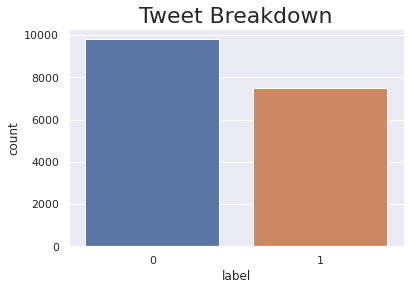

In [11]:
# Stock Sentiment Breakdown
sns.set(style="darkgrid")
ax = sns.countplot(x= Rdt['label'].index, data = Rdt['label'])
ax.set_title("Tweet Breakdown",fontsize= 22)
print('Fake =',Rdt['label'].value_counts()[0],'\n',"Real =",Rdt['label'].value_counts()[1])

In [35]:
Rdt['label'].astype(int)

id
0        1
1        0
2        1
3        1
4        1
        ..
20795    0
20796    0
20797    0
20798    1
20799    1
Name: label, Length: 17317, dtype: int64

In [36]:
# Set X and Y
X,Y = Rdt['text'], Rdt['label']

# Remove unwanted characters
X.replace("[^a-zA-Z]"," ",regex=True, inplace=True)

In [39]:
# Tokenzing
headlines1 = []
for row in (X):
    headlines1.append(list((str(row)).split()))

In [40]:
headlines1

[['House',
  'Dem',
  'Aide',
  'We',
  'Didn',
  't',
  'Even',
  'See',
  'Comey',
  's',
  'Letter',
  'Until',
  'Jason',
  'Chaffetz',
  'Tweeted',
  'It',
  'By',
  'Darrell',
  'Lucus',
  'on',
  'October',
  'Subscribe',
  'Jason',
  'Chaffetz',
  'on',
  'the',
  'stump',
  'in',
  'American',
  'Fork',
  'Utah',
  'image',
  'courtesy',
  'Michael',
  'Jolley',
  'available',
  'under',
  'a',
  'Creative',
  'Commons',
  'BY',
  'license',
  'With',
  'apologies',
  'to',
  'Keith',
  'Olbermann',
  'there',
  'is',
  'no',
  'doubt',
  'who',
  'the',
  'Worst',
  'Person',
  'in',
  'The',
  'World',
  'is',
  'this',
  'week',
  'FBI',
  'Director',
  'James',
  'Comey',
  'But',
  'according',
  'to',
  'a',
  'House',
  'Democratic',
  'aide',
  'it',
  'looks',
  'like',
  'we',
  'also',
  'know',
  'who',
  'the',
  'second',
  'worst',
  'person',
  'is',
  'as',
  'well',
  'It',
  'turns',
  'out',
  'that',
  'when',
  'Comey',
  'sent',
  'his',
  'now',
  'infa

In [41]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [42]:
# Remove Stopwords from list of tokens and perform Stemming

# Create stemming object
from nltk.stem import PorterStemmer
porter = PorterStemmer()

#Stopwords object
stop_words = set(stopwords.words('english')) 

cl_headline = []
for corp in headlines1:
    temp = []
    for word in corp:
        if word not in stop_words and len(word) > 2:
            #Perform Stemming
          temp.append(porter.stem(word))
          #temp.append(word)
    cl_headline.append(temp)

In [43]:
#Flatten the list to one giant corpus
flat_list = [' '.join(sublist) for sublist in cl_headline]

In [44]:
flat_list[0] 

'hous dem aid didn even see comey letter until jason chaffetz tweet darrel lucu octob subscrib jason chaffetz stump american fork utah imag courtesi michael jolley avail creativ common licens with apolog keith olbermann doubt worst person the world week fbi director jame comey but accord hous democrat aid look like also know second worst person well turn comey sent infam letter announc fbi look email may relat hillari clinton email server rank democrat relev committe hear comey they found via tweet one republican committe chairmen know comey notifi republican chairmen democrat rank member hous intellig judiciari oversight committe agenc review email recent discov order see contain classifi inform not long letter went oversight committe chairman jason chaffetz set polit world ablaz tweet fbi dir inform the fbi learn exist email appear pertin investig case reopen jason chaffetz jasoninthehous octob cours know case comey actual say review email light unrel case know anthoni weiner sext te

In [45]:
#Based on the number of unique words above we can set our vocab size to be around 15000
vocab_size = 10000


In [46]:
onehot_repr= [one_hot(words,vocab_size) for words in flat_list] 


In [47]:
print((onehot_repr[0]))

[3074, 6634, 8165, 2464, 7235, 3152, 6979, 9323, 200, 9820, 5136, 3281, 57, 539, 8592, 43, 9820, 5136, 3058, 6129, 4069, 2320, 8469, 6087, 2255, 6676, 5935, 5565, 5956, 6744, 9266, 324, 7005, 6868, 202, 644, 5057, 7233, 2742, 4994, 6788, 8549, 8690, 6979, 8346, 7094, 3074, 27, 8165, 3664, 4923, 1796, 5104, 221, 644, 5057, 6815, 8425, 6979, 3471, 700, 9323, 1447, 6788, 3664, 4484, 6450, 3207, 331, 6969, 4484, 928, 5395, 27, 9422, 1200, 7852, 6979, 8170, 5837, 9360, 3281, 3061, 8931, 1200, 7244, 5104, 6979, 4418, 8931, 7244, 27, 5395, 1347, 3074, 4656, 678, 7888, 1200, 8899, 6767, 4484, 4068, 6456, 7521, 3152, 9568, 7046, 6238, 4784, 5038, 9323, 6672, 7888, 1200, 1504, 9820, 5136, 5253, 5283, 2742, 3478, 3281, 6788, 3502, 6238, 7233, 6788, 7767, 3044, 4484, 4700, 4044, 3704, 4318, 3022, 9820, 5136, 412, 8592, 1568, 5104, 4318, 6979, 7857, 1201, 6767, 4484, 2711, 7501, 4318, 5104, 1490, 9377, 5424, 173, 8346, 5020, 7669, 1231, 9640, 1103, 5136, 7233, 2320, 8931, 5679, 3027, 724, 7738, 370

Embedding Layer

In [48]:
#Lets check the maximum and minimum length sub corpuses to determine maxlen parameter(USE later if not satisfied with default results)
def FindMaxLength(lst): 
    maxLength = max(len(x) for x in lst ) 
    minLength = min(len(x) for x in lst )
    return maxLength, minLength
# Driver Code 
FindMaxLength(cl_headline)

(3083, 0)

In [49]:
# Make embedding layer with default maxlen and pre padding
maxlen = 2000
embedded_News =pad_sequences(onehot_repr,padding='pre',maxlen = 2000)
print(embedded_News)

[[   0    0    0 ... 9628 4324 1793]
 [   0    0    0 ... 2363 2110 9983]
 [   0    0    0 ... 8142 5480 2198]
 ...
 [   0    0    0 ... 2980 7373 9501]
 [   0    0    0 ... 6665  312 9890]
 [   0    0    0 ...  497 5759 3784]]


In [50]:
# Create the model
from tensorflow.keras.layers import Dropout

# Set based on the unique word size above of 32269
embedding_vector_features= 60
model=Sequential()
model.add(Embedding(vocab_size,embedding_vector_features))
model.add(Dropout(0.3))
model.add(LSTM(100))
model.add(Dropout(0.3))
# Classification so output layer = 1 and sigmoid function
model.add(Dense(1,activation='sigmoid'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 60)          600000    
_________________________________________________________________
dropout_2 (Dropout)          (None, None, 60)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               64400     
_________________________________________________________________
dropout_3 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 101       
Total params: 664,501
Trainable params: 664,501
Non-trainable params: 0
_________________________________________________________________
None


In [51]:
import numpy as np
X_final=np.array(embedded_News)
y_final=np.array(Y)

In [57]:
y_final = y_final.astype(int)

In [58]:
y_final

array([1, 0, 1, ..., 0, 1, 1])

In [59]:
X_final.shape,y_final.shape

((17317, 2000), (17317,))

In [60]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.33, random_state=42)

In [61]:
### Finally Training
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs= 5,batch_size=64)

Epoch 1/5
182/182 [==============================] - 530s 3s/step - loss: 0.3601 - accuracy: 0.8355 - val_loss: 0.2659 - val_accuracy: 0.8980
Epoch 2/5
182/182 [==============================] - 540s 3s/step - loss: 0.1531 - accuracy: 0.9466 - val_loss: 0.2281 - val_accuracy: 0.9200
Epoch 3/5
182/182 [==============================] - 531s 3s/step - loss: 0.1493 - accuracy: 0.9483 - val_loss: 0.2367 - val_accuracy: 0.9234
Epoch 4/5
182/182 [==============================] - 536s 3s/step - loss: 0.0908 - accuracy: 0.9704 - val_loss: 0.2543 - val_accuracy: 0.9267
Epoch 5/5
182/182 [==============================] - 529s 3s/step - loss: 0.0636 - accuracy: 0.9797 - val_loss: 0.2670 - val_accuracy: 0.9129


In [62]:
y_pred=model.predict_classes(X_test)
#y_pred = model.predict(X_test) > 0.5).astype("int32")

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


In [ ]:
from sklearn.metrics import confusion_matrix

In [63]:
confusion_matrix(y_test,y_pred)

array([[3024,  209],
       [ 289, 2193]])

In [64]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9128608923884515